In [29]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from src.utils.image_utils import get_median_color, display_color, monk_scale
from src.utils.loaders import load_image_dataset, load_images
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.spatial import cKDTree
import pickle
from src.utils.shape_extraction import get_shape_mask_otsu
import os
from PIL import Image
import pandas as pd
import cv2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [30]:
train_data_folder_path = '/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train'
test_data_folder_path = '/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/test'
train_metadata_path = '/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/ISIC_2020_Training_GroundTruth.csv'
test_metadata_path = '/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/ISIC_2020_Test_Metadata.csv'

In [31]:
train_df = load_image_dataset(train_data_folder_path, train_metadata_path, dtypes={
    'sex': 'category', 
    'anatom_site_general': 'category', 
    'diagnosis': 'category', 
    'benign_malignant': 'category'
})
train_df.columns = train_df.columns.str.upper()
train_df.head()

,IMAGE,PATIENT,SEX,AGE_APPROX,ANATOM_SITE_GENERAL,DIAGNOSIS,BENIGN_MALIGNANT,TARGET,IMAGE_PATH
id,,,,,,,,,
0,ISIC_2637011,IP_7279968,male,45.0,head/neck,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_2637011.jpg
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_0015719.jpg
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,nevus,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_0052212.jpg
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_0068279.jpg
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_0074268.jpg


In [32]:
test_df = load_image_dataset(test_data_folder_path, test_metadata_path)
test_df.columns = test_df.columns.str.upper()
test_df.head()

,IMAGE,PATIENT,AGE_APPROX,ANATOM_SITE_GENERAL,SEX,IMAGE_PATH
id,,,,,,
0,ISIC_0052060,IP_3579794,70,NaN,male,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/test/ISIC_0052060.jpg
1,ISIC_0052349,IP_7782715,40,lower extremity,male,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/test/ISIC_0052349.jpg
2,ISIC_0058510,IP_7960270,55,torso,female,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/test/ISIC_0058510.jpg
3,ISIC_0073313,IP_6375035,50,torso,female,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/test/ISIC_0073313.jpg
4,ISIC_0073502,IP_0589375,45,lower extremity,female,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/test/ISIC_0073502.jpg


ISIC_3958018, shape = (1053, 1872, 3)


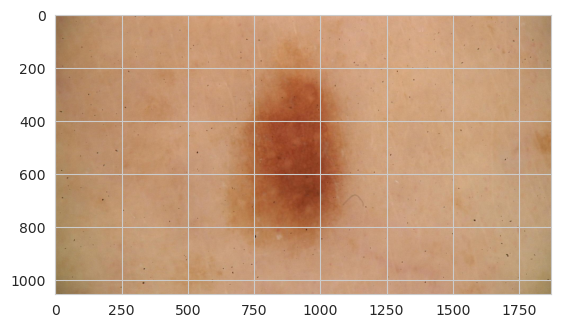

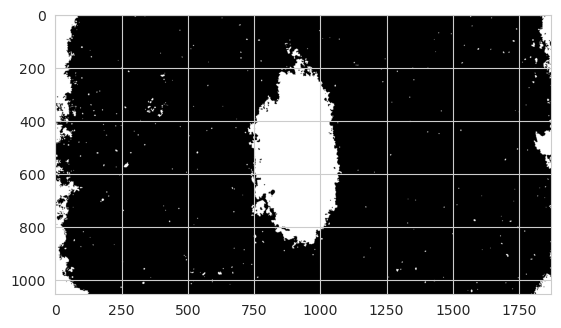

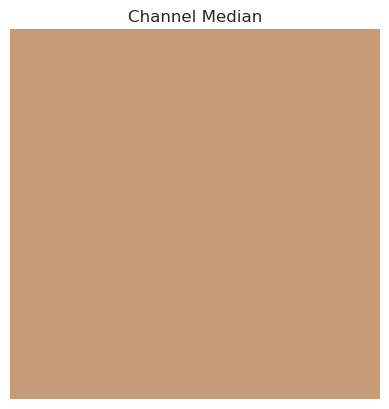

ISIC_6561863, shape = (4000, 6000, 3)


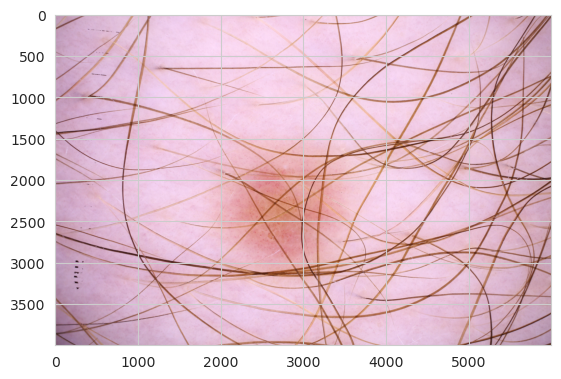

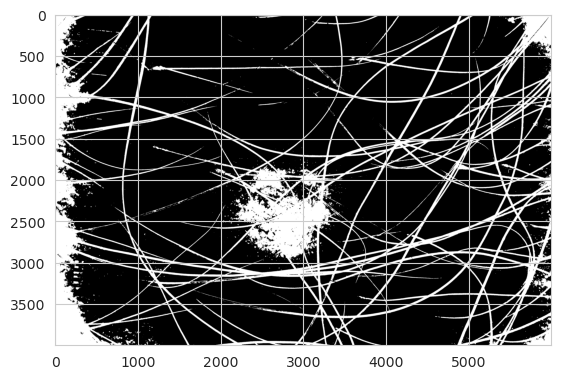

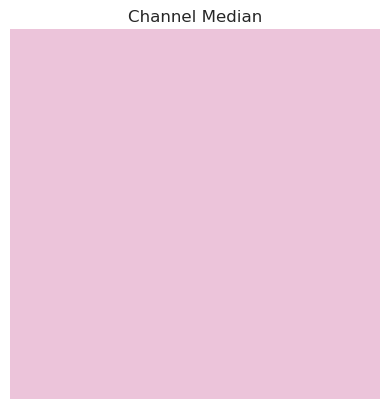

ISIC_6060065, shape = (4000, 6000, 3)


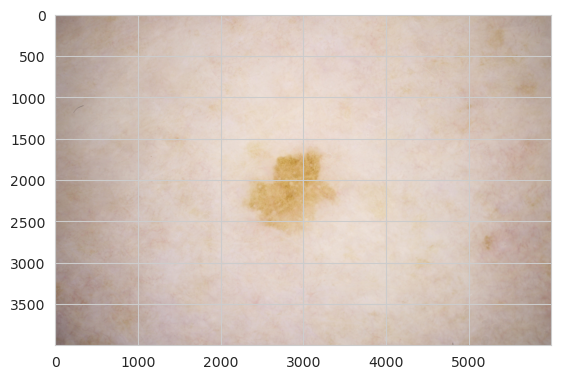

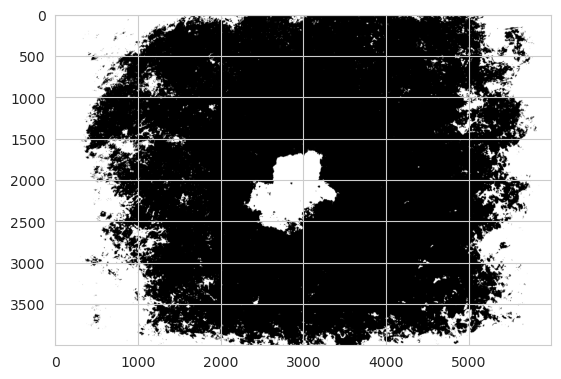

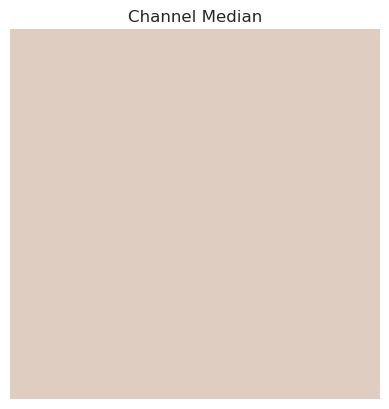

ISIC_2551089, shape = (480, 640, 3)


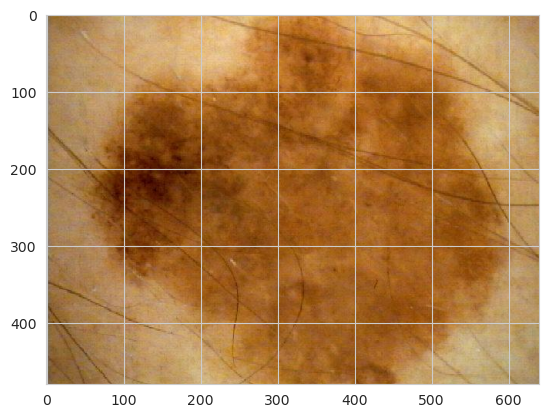

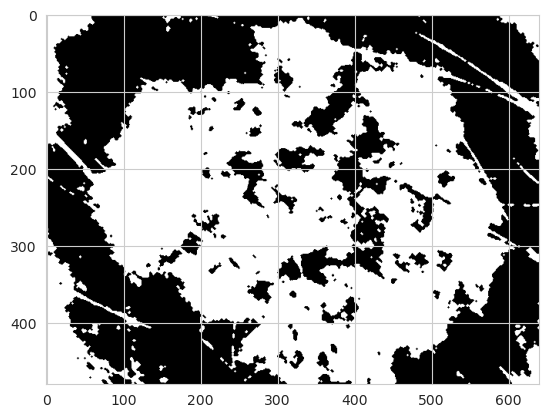

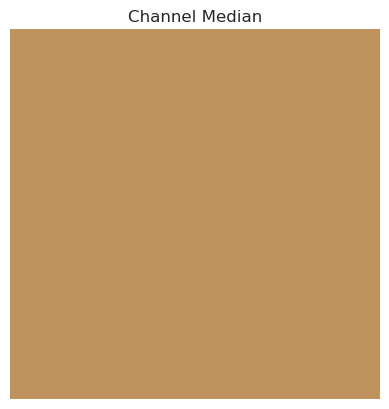

ISIC_2203150, shape = (1053, 1872, 3)


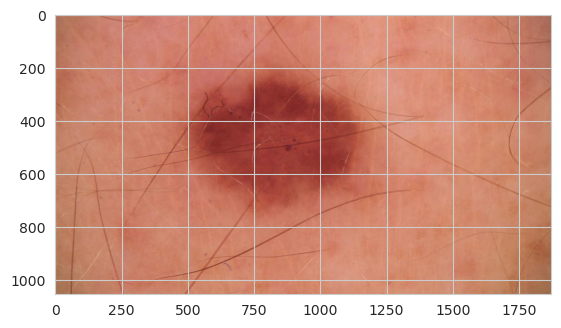

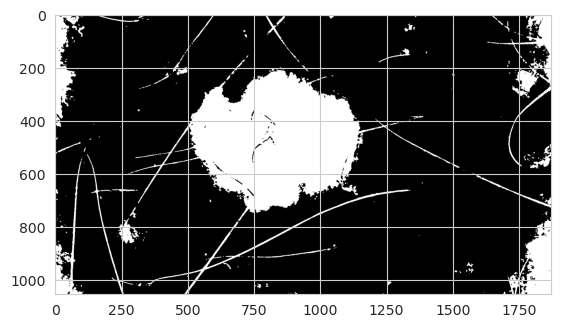

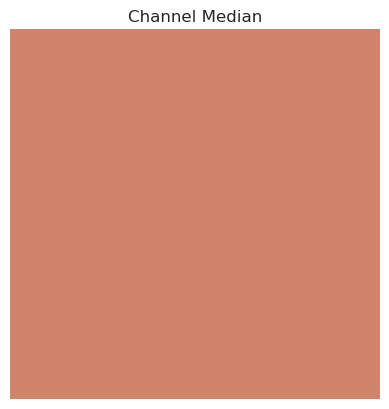

ISIC_8443990, shape = (4288, 2848, 3)


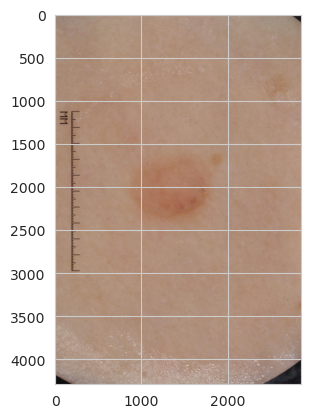

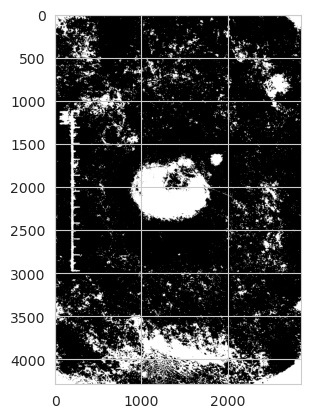

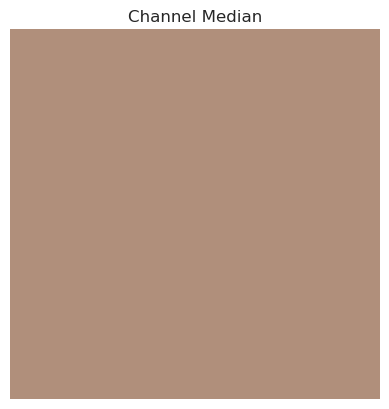

ISIC_7771421, shape = (3456, 5184, 3)


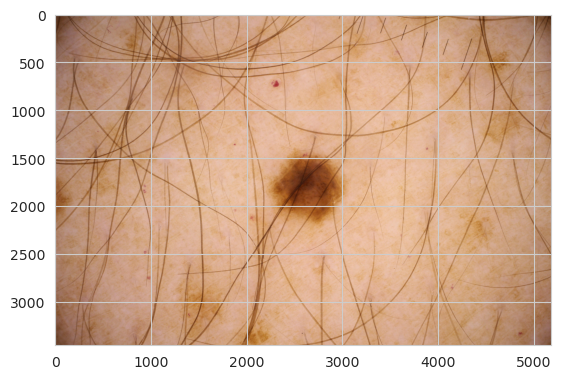

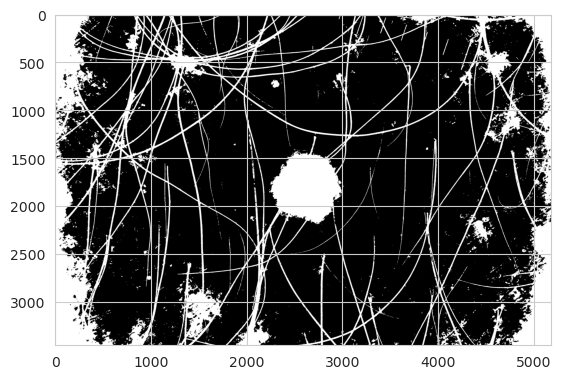

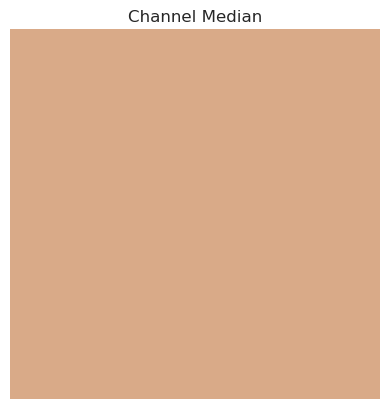

ISIC_1238085, shape = (1053, 1872, 3)


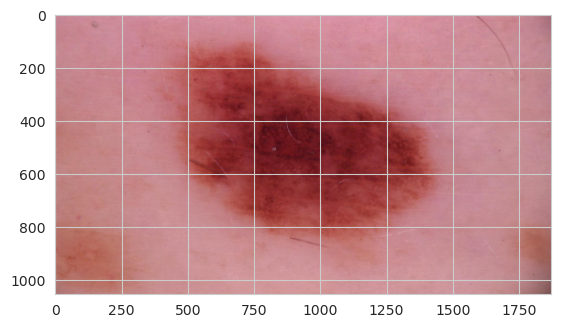

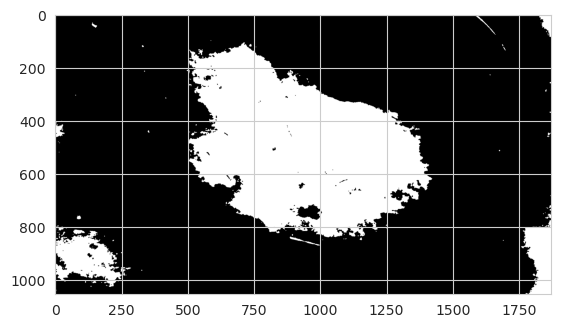

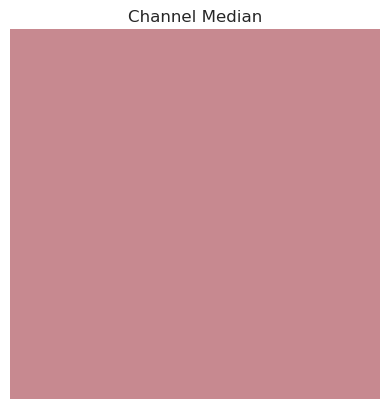

ISIC_9565522, shape = (2448, 3264, 3)


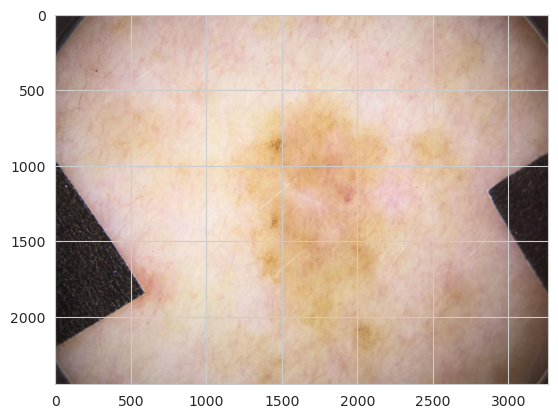

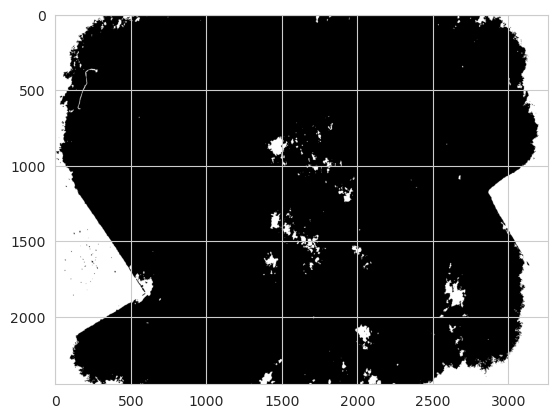

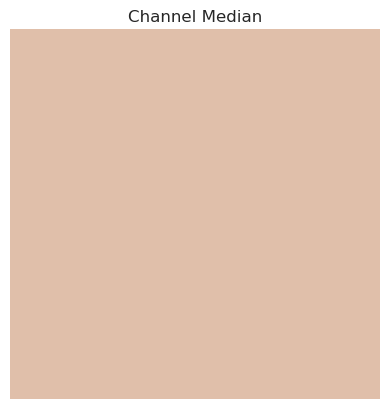

ISIC_1958290, shape = (4000, 6000, 3)


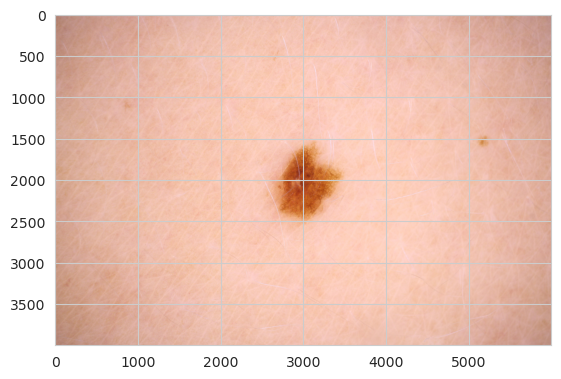

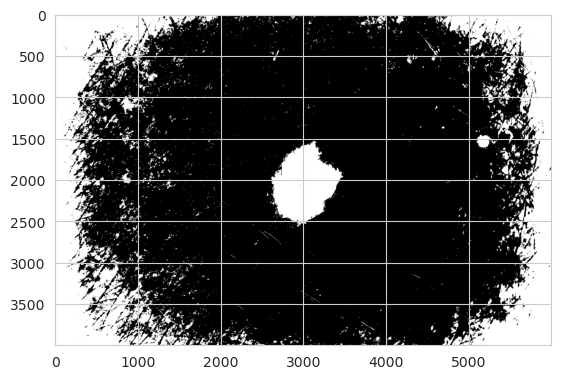

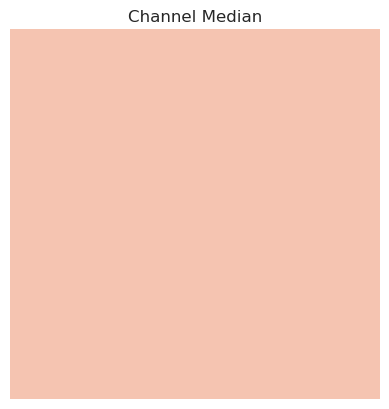

In [34]:
limit = 10
for _, image_data in zip(range(limit), load_images(test_df['IMAGE_PATH'].to_list(), 10)):
    image_name, image = image_data
    print(f'{image_name}, shape = {image.shape}')
    plt.imshow(image, cmap='gray')
    plt.show()
    mask = get_shape_mask_otsu(image)
    plt.imshow(mask, cmap='gray')
    plt.show()
    display_color(get_median_color(image, mask))
    plt.title('Channel Median')
    plt.show()

In [35]:
ROOT = ".."
file_path = f"{ROOT}/data/median_colours.pkl"
if os.path.exists(file_path):
    with open(file_path, 'rb') as file:
        median_colours_dict = pickle.load(file)
    print("Data loaded from pickle file:")
else:
    median_colours_dict = {}
    percentage = 0
    for i, image_data in enumerate(load_images(train_df['image_path'].to_list())):
        if i / train_df.shape[0] >= percentage / 100:
            print(f'{percentage}%')
            percentage += 1
        image_name, image = image_data
        mask = get_shape_mask_otsu(image)
        mask_im = Image.fromarray(mask)
        mask_im.save(f"{ROOT}/data/train_masks/{image_name}_mask.png")
        median_colours_dict[image_name] = get_median_color(image, mask)

Data loaded from pickle file:


In [36]:
if not os.path.exists(file_path):
    with open('../data/median_colours.pkl', 'wb') as file:
        pickle.dump(median_colours_dict, file)

In [37]:
median_colours = np.array(list(median_colours_dict.values()))

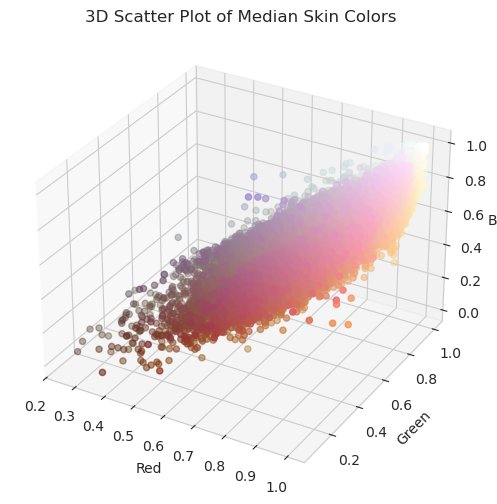

In [39]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(median_colours[:, 0]/255, median_colours[:, 1]/255, median_colours[:, 2]/255, c=median_colours/255, marker='o')

# Set labels
ax.set_xlabel('Red')
ax.set_ylabel('Green')
ax.set_zlabel('Blue')
ax.set_title('3D Scatter Plot of Median Skin Colors')

plt.show()

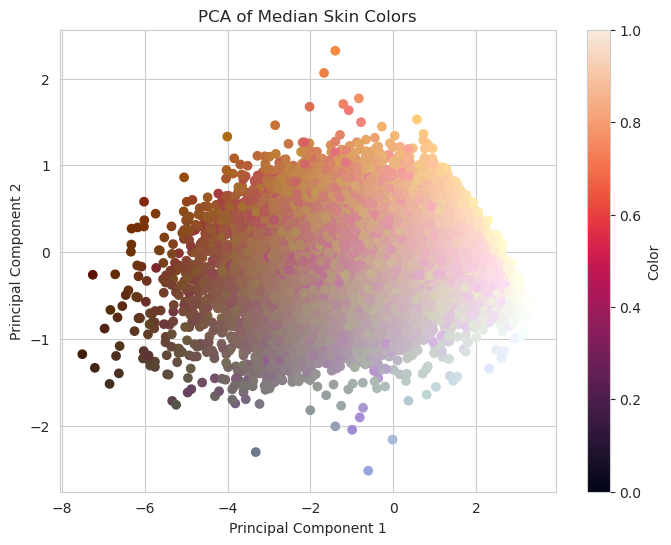

In [40]:
scaler = StandardScaler()
colors_standardized = scaler.fit_transform(median_colours)

# Apply PCA
pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
principal_components = pca.fit_transform(colors_standardized)

# Plot the results
plt.figure(figsize=(8, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], c=median_colours / 255.0)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of Median Skin Colors')
plt.colorbar(label='Color')
plt.show()

In [41]:
tree = cKDTree(monk_scale * 255)

distances, indices = tree.query(median_colours, k=1)

# Plot the scatter plot
plt.figure(figsize=(8, 6))
closest_color = []
for i, point in enumerate(median_colours):
    closest_color.append(monk_scale[indices[i]])
closest_color = np.array(closest_color)

<Figure size 800x600 with 0 Axes>

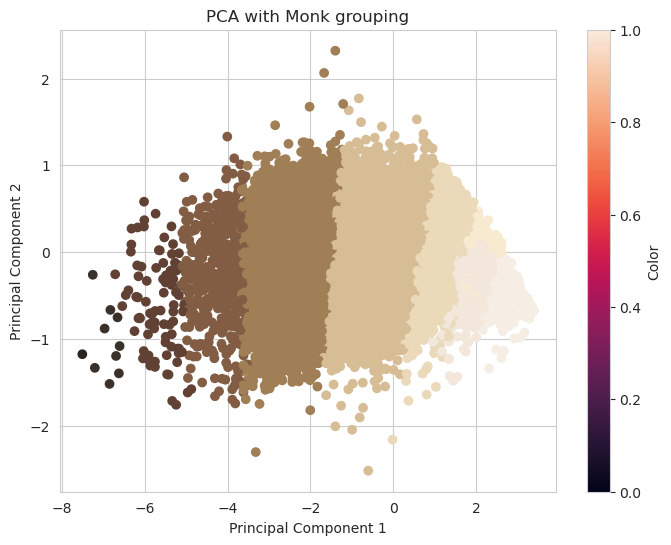

In [42]:
plt.figure(figsize=(8, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], c=closest_color)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA with Monk grouping')
plt.colorbar(label='Color')
plt.show()


<Axes: ylabel='Count'>

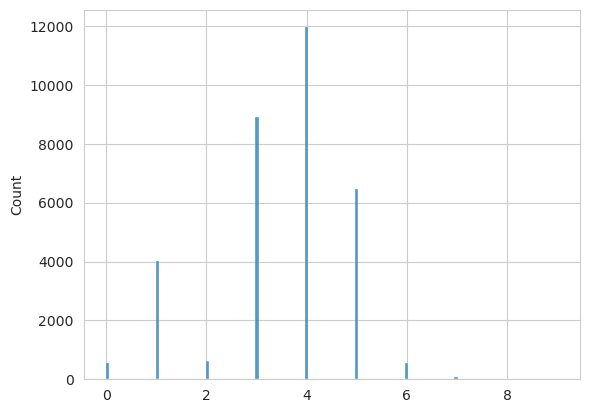

In [43]:
sns.histplot(indices)

In [44]:
import pandas as pd

pd.DataFrame({"GRUPA": indices}).value_counts()

GRUPA
4        11955
3         8897
5         6455
1         4034
2          604
6          546
0          538
7           87
8            9
9            1
Name: count, dtype: int64

In [45]:
skin_color_groups = {}
for image_path, median_colour in median_colours_dict.items():
    _, i = tree.query(median_colour, k=1)
    skin_color_groups[image_path] = i

ISIC_9996128, shape = (4000, 6000, 3)


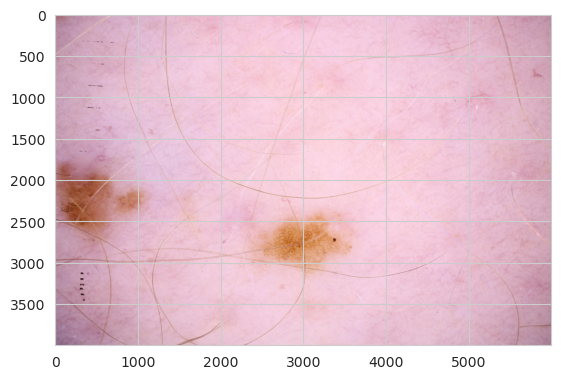

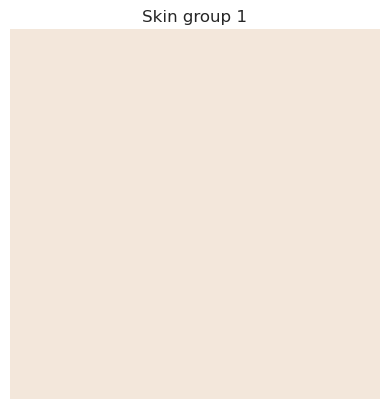

ISIC_9205063, shape = (1053, 1872, 3)


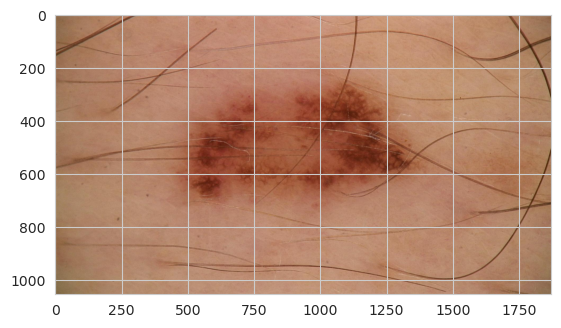

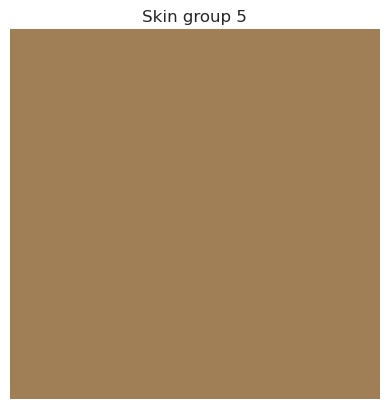

ISIC_9167794, shape = (4000, 6000, 3)


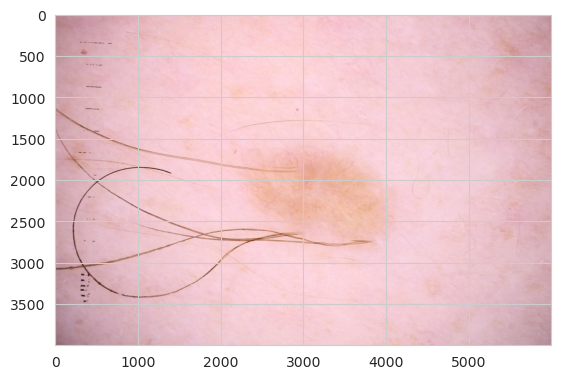

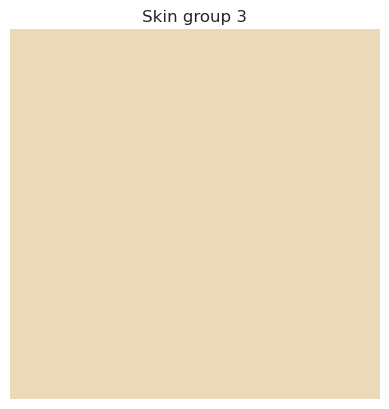

ISIC_3197616, shape = (2448, 3264, 3)


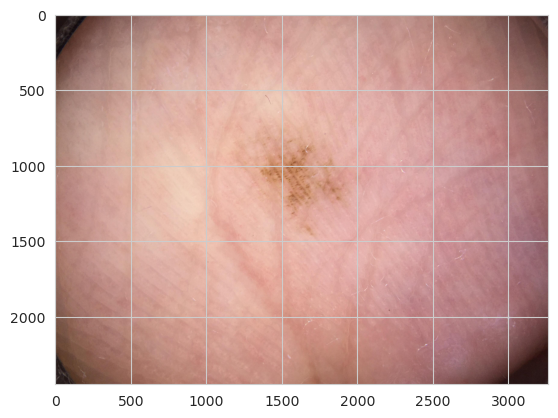

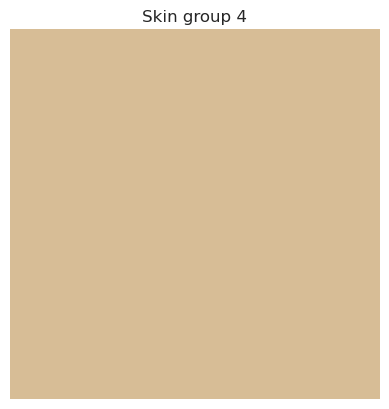

ISIC_0959735, shape = (3456, 5184, 3)


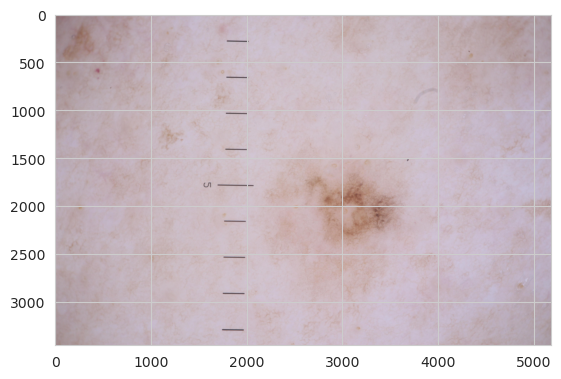

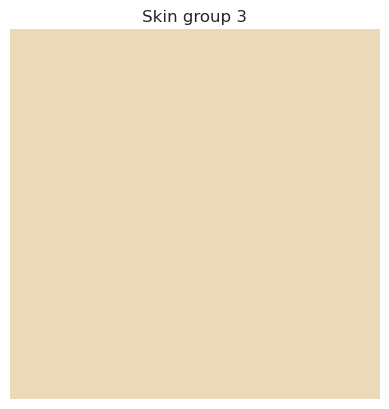

ISIC_4113246, shape = (1053, 1872, 3)


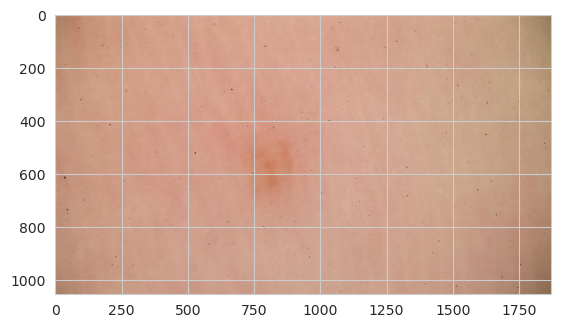

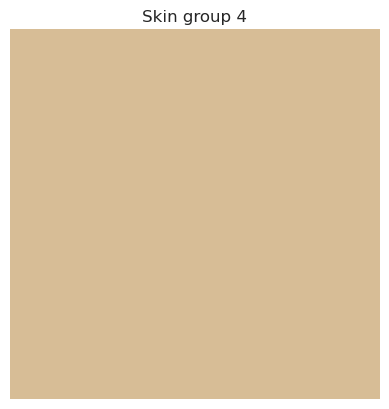

ISIC_5438125, shape = (4000, 6000, 3)


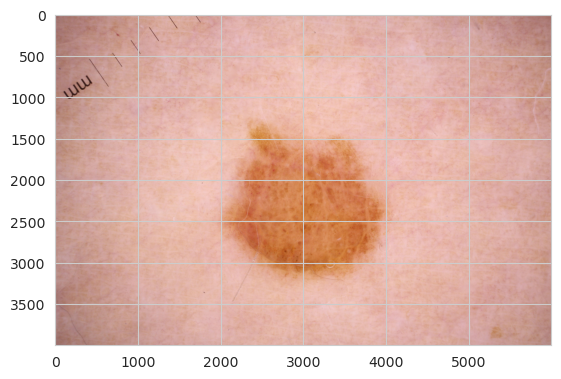

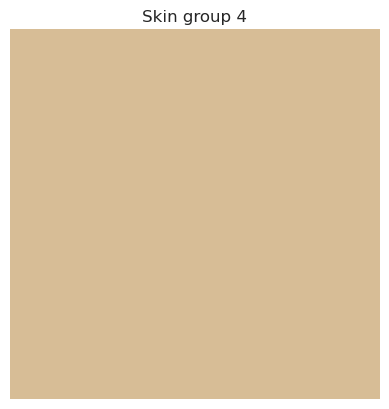

ISIC_7783346, shape = (480, 640, 3)


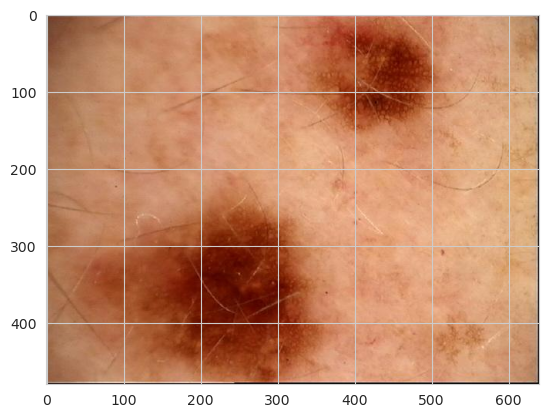

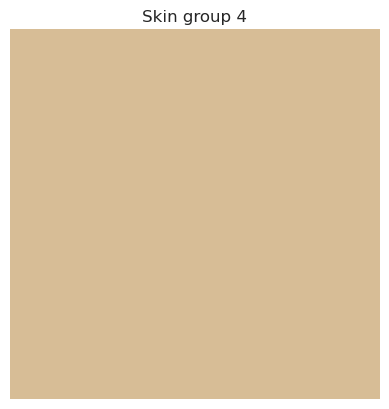

ISIC_8805000, shape = (4000, 6000, 3)


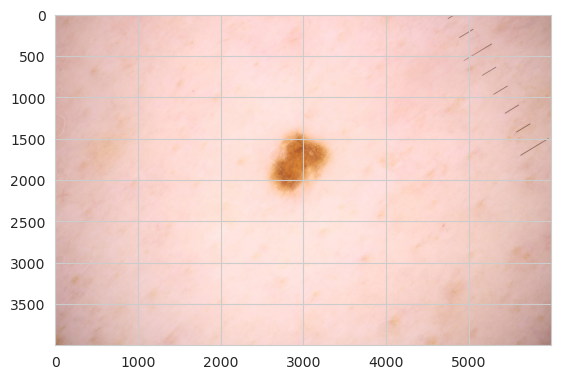

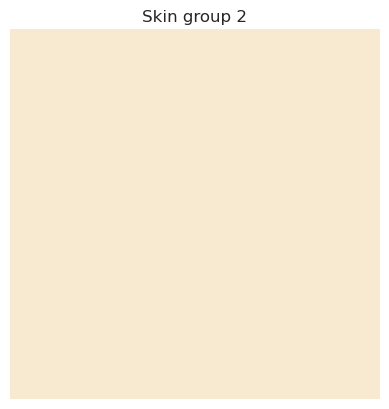

ISIC_1397669, shape = (1936, 2592, 3)


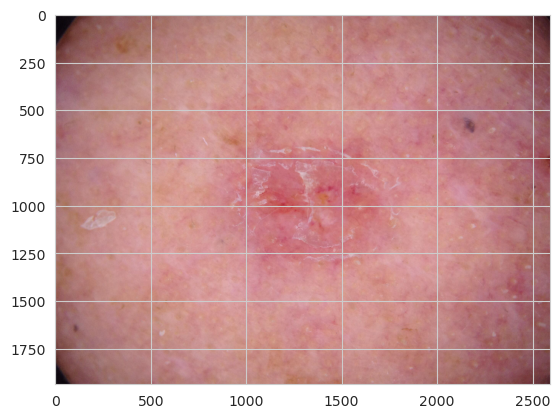

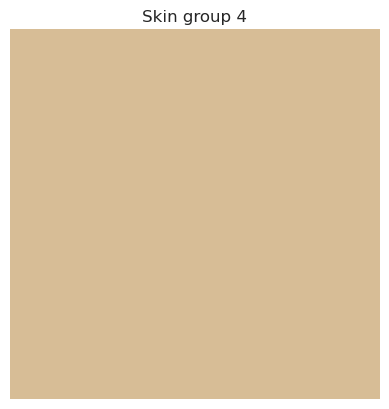

In [47]:
limit = 10
for _, image_data in zip(range(limit), load_images(train_df['IMAGE_PATH'].to_list(), 10)):
    image_name, image = image_data
    print(f'{image_name}, shape = {image.shape}')
    plt.imshow(image, cmap='gray')
    plt.show()
    display_color(monk_scale[skin_color_groups[image_name]] * 255)
    plt.title(f'Skin group {skin_color_groups[image_name]}')
    plt.show()

In [48]:
if not os.path.exists('../data/skin_color_groups.pkl'):
    with open('../data/skin_color_groups.pkl', 'wb') as file:
        pickle.dump(skin_color_groups, file)

In [50]:
groups_df = pd.DataFrame({
    "IMAGE": skin_color_groups.keys(),
    "GROUP": skin_color_groups.values()
})
groups_df.head()

,IMAGE,GROUP
0,ISIC_2637011,4
1,ISIC_0015719,4
2,ISIC_0052212,4
3,ISIC_0068279,6
4,ISIC_0074268,4
...,...,...
33121,ISIC_9999134,4
33122,ISIC_9999320,1
33123,ISIC_9999515,5
33124,ISIC_9999666,5


In [51]:
train_df = train_df.merge(groups_df, how='left', on="IMAGE")
train_df.head()

,IMAGE,PATIENT,SEX,AGE_APPROX,ANATOM_SITE_GENERAL,DIAGNOSIS,BENIGN_MALIGNANT,TARGET,IMAGE_PATH,GROUP
0,ISIC_2637011,IP_7279968,male,45.0,head/neck,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_2637011.jpg,4
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_0015719.jpg,4
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,nevus,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_0052212.jpg,4
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_0068279.jpg,6
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_0074268.jpg,4


In [52]:
group_example_df = train_df.drop_duplicates(subset=["GROUP", "TARGET"], keep='last').sort_values(by=["GROUP", "TARGET"])

In [53]:
group_example_df.head()

,IMAGE,PATIENT,SEX,AGE_APPROX,ANATOM_SITE_GENERAL,DIAGNOSIS,BENIGN_MALIGNANT,TARGET,IMAGE_PATH,GROUP
33096,ISIC_9991394,IP_2321962,female,30.0,torso,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_9991394.jpg,0
29231,ISIC_8838753,IP_6292815,female,65.0,lower extremity,melanoma,malignant,1,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_8838753.jpg,0
33122,ISIC_9999320,IP_3650745,male,65.0,torso,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_9999320.jpg,1
31745,ISIC_9593940,IP_7476769,male,70.0,torso,melanoma,malignant,1,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_9593940.jpg,1
33120,ISIC_9999127,IP_9583707,male,20.0,torso,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_9999127.jpg,2
26474,ISIC_8027899,IP_7785592,male,30.0,lower extremity,melanoma,malignant,1,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_8027899.jpg,2
33116,ISIC_9998582,IP_0414408,male,50.0,lower extremity,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_9998582.jpg,3
31809,ISIC_9612481,IP_4611463,male,70.0,head/neck,melanoma,malignant,1,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_9612481.jpg,3
33121,ISIC_9999134,IP_6526534,male,50.0,torso,unknown,benign,0,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_9999134.jpg,4
33014,ISIC_9967383,IP_7887363,male,60.0,upper extremity,melanoma,malignant,1,/media/babinsinko/Expansion/Projects/lumen-melanoma-gradientclippers/data/train/ISIC_9967383.jpg,4


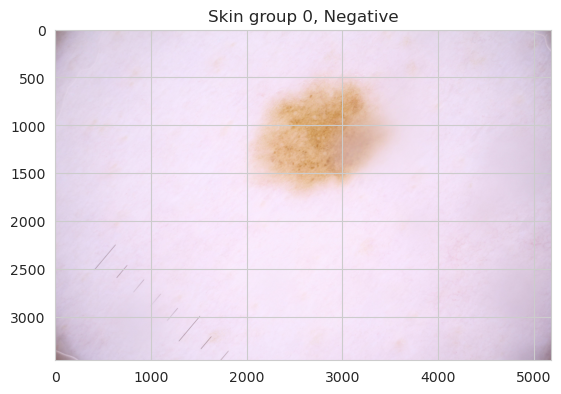

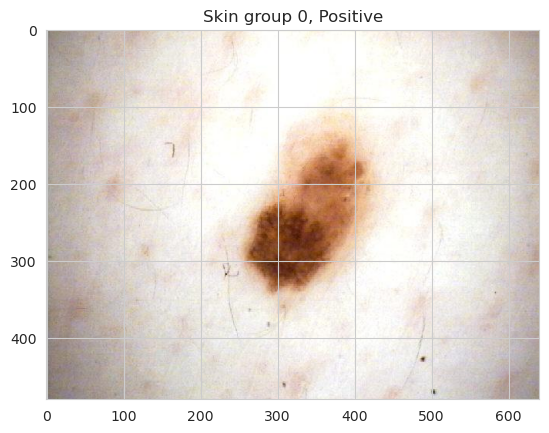

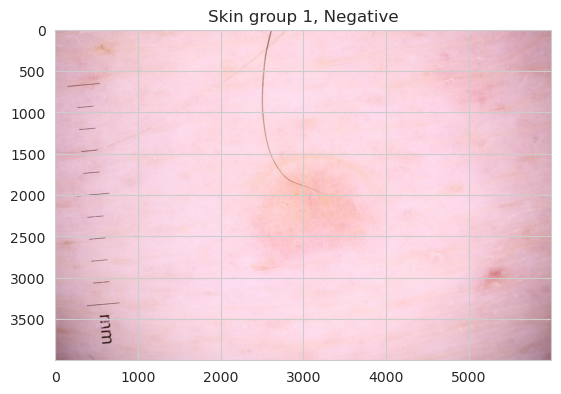

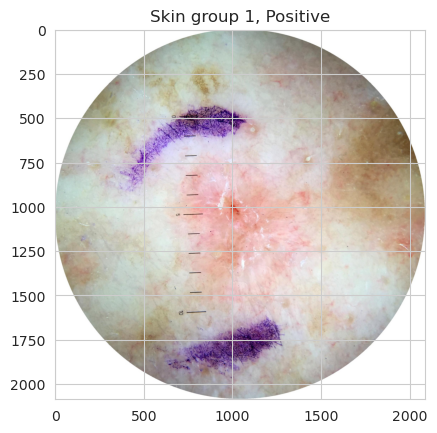

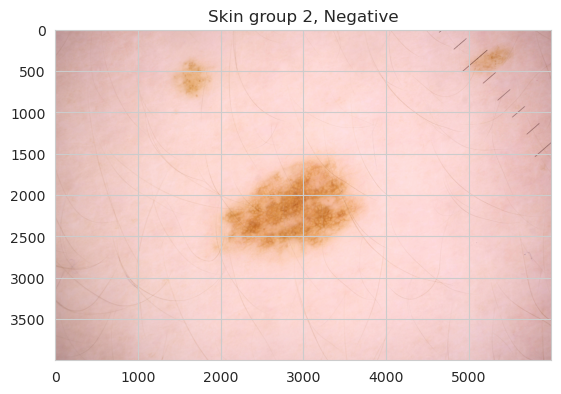

...

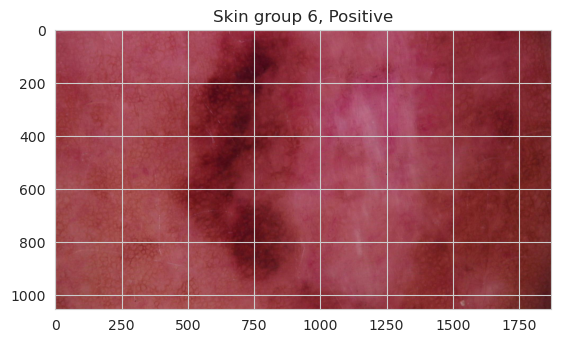

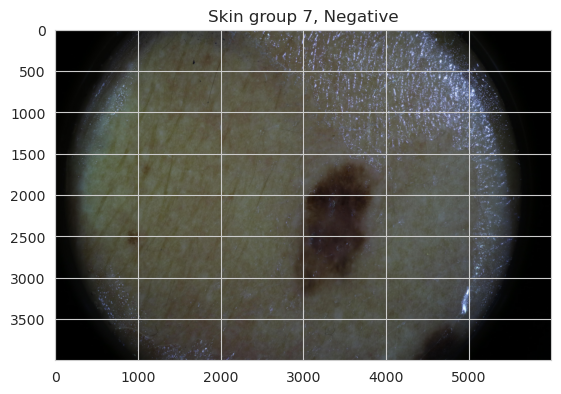

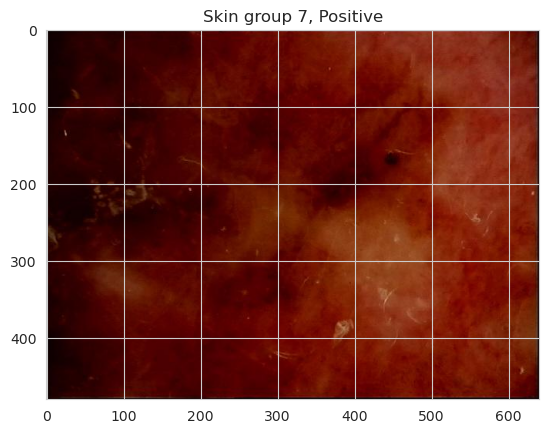

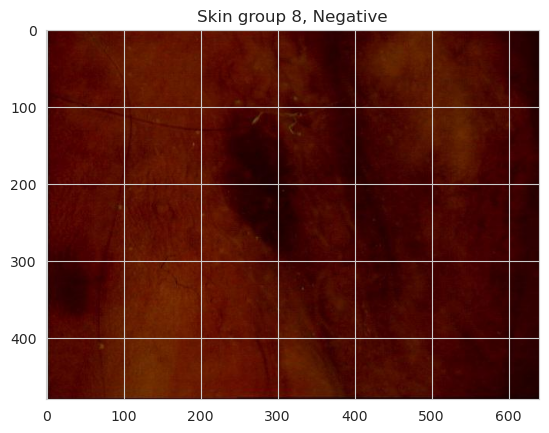

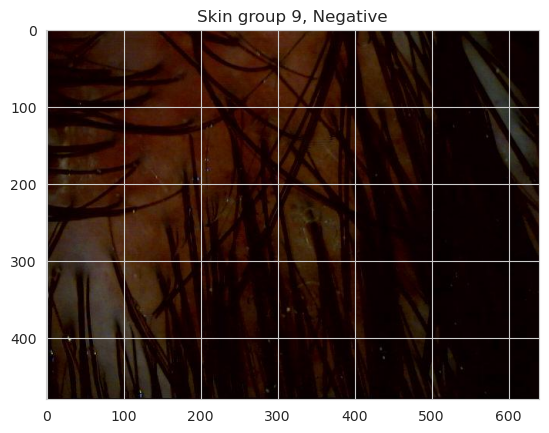

In [56]:
for _, row in group_example_df.iterrows():
    image = cv2.imread(f'../data/train/{row["IMAGE"]}.jpg', cv2.IMREAD_COLOR_RGB)
    plt.imshow(image, cmap='gray')
    plt.title(f'Skin group {row["GROUP"]}, {"Negative" if row["TARGET"] == 0 else "Positive"}')
    plt.show()
    # mask = cv2.imread(f'../data/train_masks/{row["IMAGE"]}_mask.png', cv2.IMREAD_COLOR_RGB)
    # plt.imshow(mask, cmap='gray')
    # plt.title(f'Maska')
    # plt.show()
    # display_color(monk_scale[row["GROUP"]] * 255)
    # plt.title(f'Skin group {row["GROUP"]}')
    # plt.show()

In [57]:
grouped_train_df = train_df.assign(COUNT=1).groupby(["GROUP", "TARGET"], as_index=False)["COUNT"].sum().sort_values(["GROUP", "TARGET"])
grouped_train_df = grouped_train_df.pivot(index="GROUP", columns="TARGET", values="COUNT").reset_index().fillna(0)
grouped_train_df.columns = ["GROUP", "NEGATIVE", "POSITIVE"]
grouped_train_df['RATIO'] = grouped_train_df['POSITIVE'] / (grouped_train_df['POSITIVE'] + grouped_train_df['NEGATIVE'])
grouped_train_df

,GROUP,NEGATIVE,POSITIVE,RATIO
0,0,529.0,9.0,0.016729
1,1,4012.0,22.0,0.005454
2,2,600.0,4.0,0.006623
3,3,8858.0,39.0,0.004384
4,4,11658.0,297.0,0.024843
5,5,6268.0,187.0,0.028970
6,6,524.0,22.0,0.040293
7,7,83.0,4.0,0.045977
8,8,9.0,0.0,0.000000
9,9,1.0,0.0,0.000000


In [60]:
train_df.drop(columns="IMAGE_PATH").to_feather("../processed_data/train_df.feather")